<a href="https://colab.research.google.com/github/eortegaa1500/NasaSpaceAppsChallenge/blob/main/Art%26SoundJunoCam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Creación de arte mediante imágenes de la sonda Juno

In [ ]:
import functools
import os

from matplotlib import gridspec
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub

print("TF Version: ", tf.__version__) #TF Version:  2.4.1
print("TF-Hub version: ", hub.__version__)
print("Eager mode enabled: ", tf.executing_eagerly())
print("GPU available: ", tf.test.is_gpu_available()) #Activar GPU recomendado.

TF Version:  2.2.1
TF-Hub version:  0.12.0
Eager mode enabled:  True
GPU available:  True


In [ ]:
!pip install tensorflow==2.2.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
cd /content/

/content


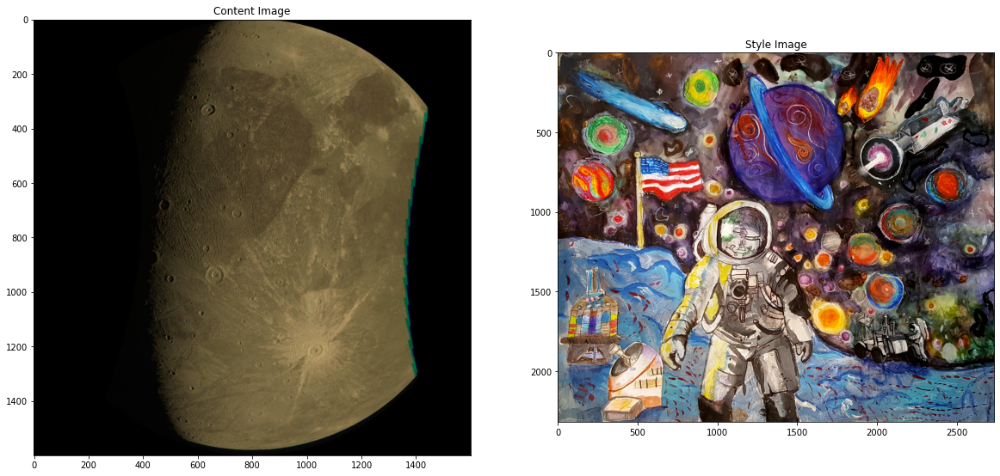

In [ ]:
import tensorflow_hub as hub
import matplotlib.pyplot as plt


content_path = 'J18.JPG'
style_path = 'Art3.jpg'

# Load the content and style images
content = plt.imread(content_path)
style = plt.imread(style_path)

# Display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Content and style images side-by-side
ax1.imshow(content)
ax1.set_title('Content Image')
ax2.imshow(style)
ax2.set_title('Style Image')
plt.show()

In [ ]:
# Load content and style images (see example in the attached colab).
content_image = plt.imread(content_path)
style_image = plt.imread(style_path)

# Convert to float32 numpy array, add batch dimension, and normalize to range [0, 1]. Example using numpy:
content_image = content_image.astype(np.float32)[np.newaxis, ...] / 255.
style_image = style_image.astype(np.float32)[np.newaxis, ...] / 255.

# Optionally resize the images. 
style_image = tf.image.resize(style_image, (256, 256))

In [ ]:
# Load TF-Hub module.

hub_handle = 'https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2'
hub_module = hub.load(hub_handle)

outputs = hub_module(tf.convert_to_tensor(content_image), tf.convert_to_tensor(style_image))
stylized_image = outputs[0]

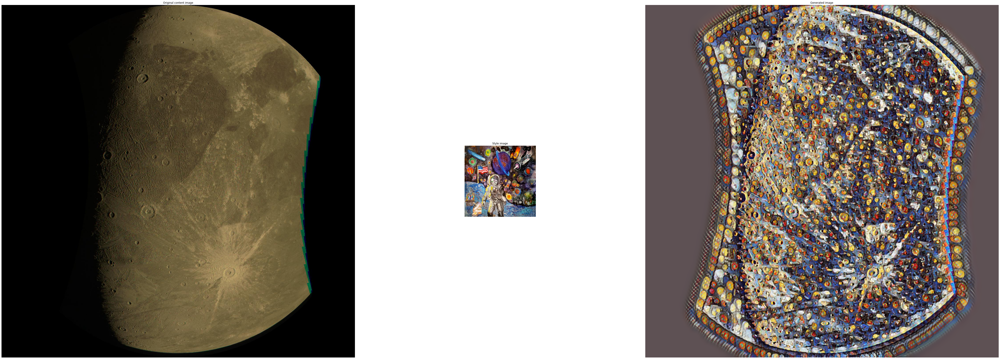

In [ ]:
def show_n(images, titles=('',)):
  n = len(images)
  image_sizes = [image.shape[1] for image in images]
  w = (image_sizes[0] * 6) // 320
  plt.figure(figsize=(w  * n, w))
  gs = gridspec.GridSpec(1, n, width_ratios=image_sizes)
  for i in range(n):
    plt.subplot(gs[i])
    plt.imshow(images[i][0], aspect='equal')
    plt.axis('off')
    plt.title(titles[i] if len(titles) > i else '')
  plt.show()

show_n([content_image, style_image, stylized_image], titles=['Original content image', 'Style image', 'Generated image'])

# Escuchando las imagenes de la sonda Juno

In [ ]:
from IPython.display import Audio, display

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


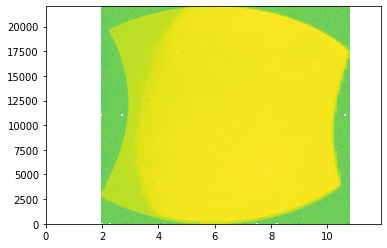

In [ ]:

import wave

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from matplotlib.mlab import window_none


def img2wav(img_path, wav_path, fft_size=1024):
    img = Image.open('J18.JPG').convert('L')
    img = img.resize((img.width * fft_size // 2 // img.height, fft_size // 2),
                     Image.BICUBIC)

    img = np.array(img, 'float')
    img = img
    img = img[::-1].T

    max_sum = max(col.sum() for col in img)
    if max_sum > 1:
        img /= max_sum

    with wave.open(wav_path, 'wb') as f:
        f.setparams((1, 2, 44100, len(img) * fft_size, 'NONE', ''))
        for col in img:
            data = np.fft.ifft(col * fft_size, fft_size).real * 32767

            for index in np.where(data < -32768):
                data[index] = -32768
            for index in np.where(data > 32767):
                data[index] = 32767

            # Escribir en un archivo wav
            data = data.astype('short')
            f.writeframesraw(data)


def draw_spectrum(wav_path, fft_size=1024):
    """
         Dibujar espectrograma de audio
         : param wav_path: ruta de entrada de audio
         : param fft_size: longitud utilizada para la transformada de Fourier
    """

    # Leer wav
    with wave.open(wav_path, 'rb') as f:
        n_samples = f.getnframes()
        data = f.readframes(n_samples)
        n_channels = f.getnchannels()
        sample_rate = f.getframerate()

    data = np.fromstring(data, 'short')
    data.shape = (n_samples, n_channels)
    data = data.T[0]

    # Espectro
    plt.specgram(data / 32767, fft_size, sample_rate, window=window_none,
                 noverlap=0, scale='dB')
    plt.show()


if __name__ == '__main__':
    img2wav('test.jpg', 'test.wav')
    draw_spectrum('test.wav')
    
display(Audio('test.wav',autoplay=True))